In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Ship_Performance_Dataset.csv')

In [ ]:
df.head()

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
0,2023-06-04,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2736 entries, 0 to 2735
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Date                     2736 non-null   object 
 1   Ship_Type                2600 non-null   object 
 2   Route_Type               2600 non-null   object 
 3   Engine_Type              2600 non-null   object 
 4   Maintenance_Status       2600 non-null   object 
 5   Speed_Over_Ground_knots  2736 non-null   float64
 6   Engine_Power_kW          2736 non-null   float64
 7   Distance_Traveled_nm     2736 non-null   float64
 8   Draft_meters             2736 non-null   float64
 9   Weather_Condition        2600 non-null   object 
 10  Cargo_Weight_tons        2736 non-null   float64
 11  Operational_Cost_USD     2736 non-null   float64
 12  Revenue_per_Voyage_USD   2736 non-null   float64
 13  Turnaround_Time_hours    2736 non-null   float64
 14  Efficiency_nm_per_kWh   

# Data preprocessing

### Converting datatypes to appropriate formats

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
df.describe(include='object')

,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Weather_Condition
count,2600,2600,2600,2600,2600
unique,4,4,3,3,3
top,Bulk Carrier,Long-haul,Diesel,Good,Calm
freq,669,686,892,873,893


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2736 entries, 0 to 2735
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date                     2736 non-null   datetime64[ns]
 1   Ship_Type                2600 non-null   object        
 2   Route_Type               2600 non-null   object        
 3   Engine_Type              2600 non-null   object        
 4   Maintenance_Status       2600 non-null   object        
 5   Speed_Over_Ground_knots  2736 non-null   float64       
 6   Engine_Power_kW          2736 non-null   float64       
 7   Distance_Traveled_nm     2736 non-null   float64       
 8   Draft_meters             2736 non-null   float64       
 9   Weather_Condition        2600 non-null   object        
 10  Cargo_Weight_tons        2736 non-null   float64       
 11  Operational_Cost_USD     2736 non-null   float64       
 12  Revenue_per_Voyage_USD   2736 non-

In [ ]:
df.isnull().sum()

,0
Date,0
Ship_Type,136
Route_Type,136
Engine_Type,136
Maintenance_Status,136
Speed_Over_Ground_knots,0
Engine_Power_kW,0
Distance_Traveled_nm,0
Draft_meters,0
Weather_Condition,136


In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
for col in df.select_dtypes('object'):
  print(df[col].value_counts())

Ship_Type
Bulk Carrier      669
Fish Carrier      653
Tanker            643
Container Ship    635
Name: count, dtype: int64
Route_Type
Long-haul       686
Coastal         650
Transoceanic    638
Short-haul      626
Name: count, dtype: int64
Engine_Type
Diesel                  892
Steam Turbine           855
Heavy Fuel Oil (HFO)    853
Name: count, dtype: int64
Maintenance_Status
Good        873
Fair        867
Critical    860
Name: count, dtype: int64
Weather_Condition
Calm        893
Moderate    891
Rough       816
Name: count, dtype: int64


There are no duplicates and data inconsistencies in the dataset, but the object columns have missing values, which i will now analyze and impute

### Analyzing and imputing missing values

In [ ]:
df[df['Ship_Type'].isnull()]

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
8,2023-07-30,NaN,Coastal,Heavy Fuel Oil (HFO),Good,17.309362,1179.018805,429.564313,6.002358,Moderate,1953.447929,346071.519942,448682.864128,14.451820,0.977448,0.764914,8,50.247060
22,2023-11-05,NaN,Coastal,Heavy Fuel Oil (HFO),Good,18.754870,1305.423686,354.599675,8.052450,Calm,1725.687770,14878.151924,902159.371696,31.406581,0.930002,0.864772,2,89.546126
24,2023-11-19,NaN,Coastal,Diesel,Good,18.069011,2922.282582,559.861349,10.417704,Calm,1741.081025,333900.581735,848139.264094,20.006238,0.699553,1.164695,4,58.541232
26,2023-12-03,NaN,Coastal,Heavy Fuel Oil (HFO),Critical,20.994958,2296.329786,275.187105,7.124895,Calm,53.516553,114527.880930,506111.037748,52.774581,0.243271,0.757688,1,66.678393
61,2023-07-02,NaN,Short-haul,Steam Turbine,Fair,22.234745,1410.198699,1163.576296,9.555535,Rough,94.726163,256534.740657,454223.301498,49.875138,1.243155,0.862299,9,80.209144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2674,2024-06-02,NaN,Transoceanic,Heavy Fuel Oil (HFO),Fair,14.339485,579.015170,1937.638911,12.712176,Calm,524.204024,300632.396512,511493.283613,26.926088,1.036168,1.364926,8,86.639690
2679,2023-06-04,NaN,Coastal,Steam Turbine,Fair,16.238114,2274.812065,338.048493,5.502260,Rough,1442.489639,170068.803091,434539.452635,58.648966,1.010171,1.258953,3,93.528073
2684,2023-07-09,NaN,Long-haul,Heavy Fuel Oil (HFO),Critical,16.738158,1319.427369,1635.251855,5.193324,Moderate,1396.971824,165613.074391,784103.830148,52.336626,0.917655,0.648691,1,89.172367
2702,2023-11-12,NaN,Coastal,Diesel,Good,16.863410,2396.514301,1859.692262,5.595265,Rough,755.505988,318293.988764,902140.534774,18.084346,1.134419,1.453068,6,50.943220


The missing values are in `ship_type`, `Route_Type`, `Engine_Type`, `Maintenance_Status`, and `Weather_Condition`.

I can impute them by mode values, but in all these columns the unique values have roughly equal frequencies, so filling missing values with one category would introduce bias. This could distort the distribution and lead to misleading analysis.

Therefore, I will make an extra category `Unknown` for the missing values.

In [ ]:
#Replacing missing values with 'Unknown'

missing_columns = ['Ship_Type',	'Route_Type',	'Engine_Type', 'Maintenance_Status', 'Weather_Condition']
df[missing_columns] = df[missing_columns].fillna('Unknown')

### Data Visualization

array([[<Axes: title={'center': 'Date'}>,
        <Axes: title={'center': 'Speed_Over_Ground_knots'}>,
        <Axes: title={'center': 'Engine_Power_kW'}>,
        <Axes: title={'center': 'Distance_Traveled_nm'}>],
       [<Axes: title={'center': 'Draft_meters'}>,
        <Axes: title={'center': 'Cargo_Weight_tons'}>,
        <Axes: title={'center': 'Operational_Cost_USD'}>,
        <Axes: title={'center': 'Revenue_per_Voyage_USD'}>],
       [<Axes: title={'center': 'Turnaround_Time_hours'}>,
        <Axes: title={'center': 'Efficiency_nm_per_kWh'}>,
        <Axes: title={'center': 'Seasonal_Impact_Score'}>,
        <Axes: title={'center': 'Weekly_Voyage_Count'}>],
       [<Axes: title={'center': 'Average_Load_Percentage'}>, <Axes: >,
        <Axes: >, <Axes: >]], dtype=object)

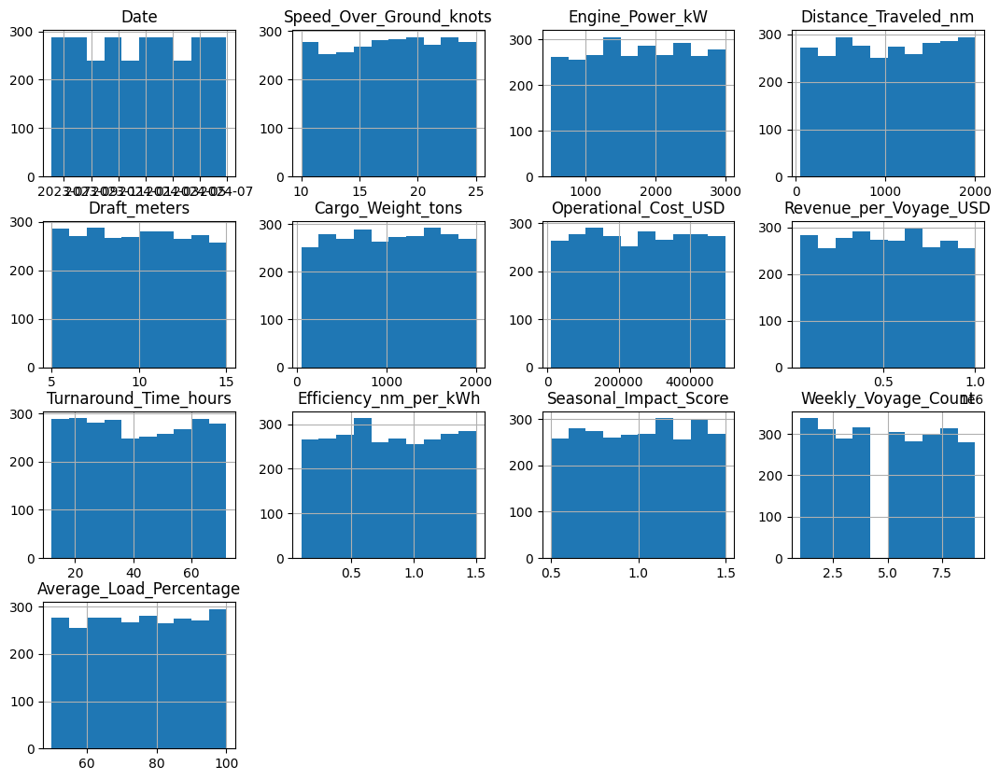

In [ ]:
df.hist(figsize=(13,10))

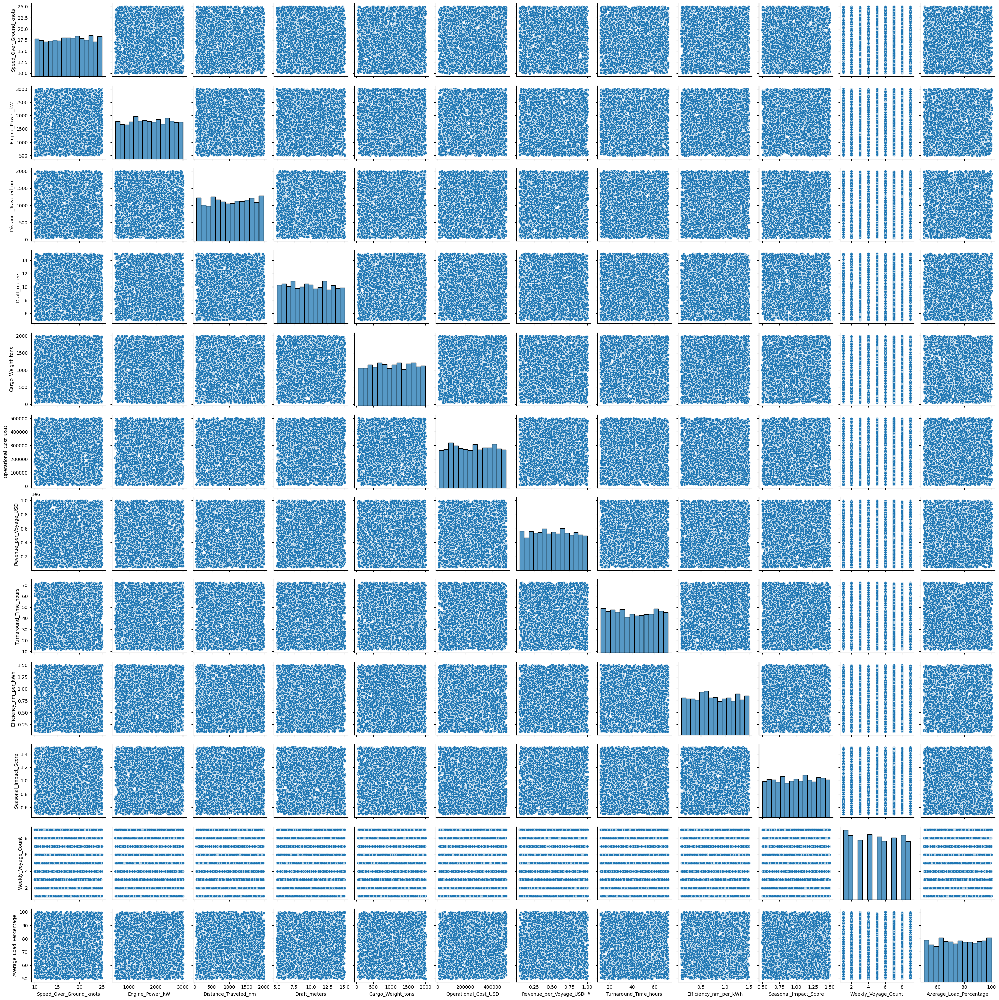

In [ ]:
sns.pairplot(df)

As seen from the pairplot, the data is homogeneous. The slight variation is just noise and this means that no meaningful cluster can be made out of the dataset

### Checking correlation

<Axes: >

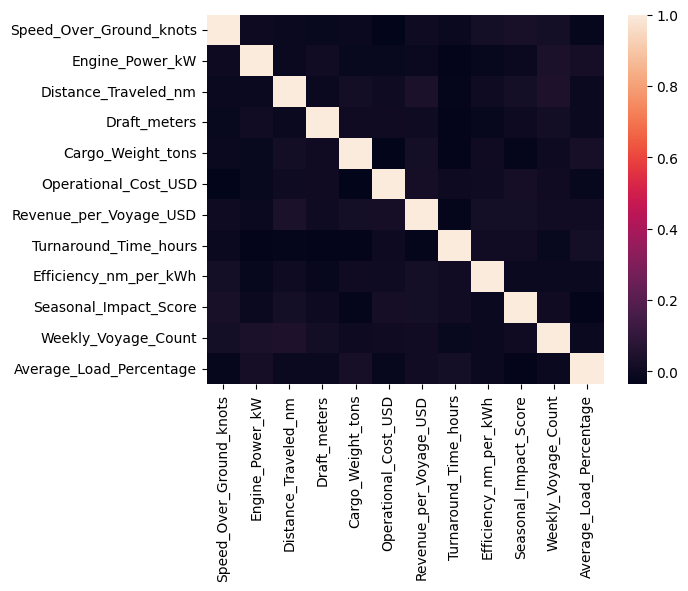

In [ ]:
sns.heatmap(df.select_dtypes(include='number').corr())

There is lack of correlation among all the variables. This might or might not effect how good clusters are made. We'll see this in further analysis

### Selecting features

I selected all the features except `Maintenance_status` and `Weather_condition`, because they are not predictable and will add noise to clusters. In further tries, I will remove unecessary features.



In [ ]:
features_to_use = ['Speed_Over_Ground_knots', 'Engine_Power_kW', 'Distance_Traveled_nm', 'Cargo_Weight_tons',
                   'Operational_Cost_USD',
                  'Revenue_per_Voyage_USD', 'Turnaround_Time_hours', 'Efficiency_nm_per_kWh', 'Weekly_Voyage_Count', 'Average_Load_Percentage']

#check: distance_traveled, draft_meters, turnaround_time_hours, Seasonal_Impact_Score, Weekly_Voyage_Count

df_selected = df[features_to_use]

### Standardize the data

In [ ]:
to_scale = df_selected.columns

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler = StandardScaler()

df_selected[to_scale] = scaler.fit_transform(df_selected[to_scale])

/tmp/ipython-input-18-1623266533.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected[to_scale] = scaler.fit_transform(df_selected[to_scale])


### Encoding features

* `Ship_type`, `Route_Type`, `Engine_Type`: I will One-Hot Encode these features because this is nominal data

* `Maintenance_Status`, `Weather_Condition`: I will Label-Encode these features because this is ordinal data. For example, in `Maintenance_Status`, Good comes first, then Fair, then Critical

In [ ]:
'''#one_hot_columns = ['Ship_Type',	'Route_Type',	'Engine_Type']
#One-hot encoding
df_selected = pd.get_dummies(df_selected, columns=['Route_Type'], drop_first=True)

#Label_encoding
df_selected['Maintenance_Status'] = df_selected['Maintenance_Status'].replace({'Unknown':0, 'Good':1, 'Fair':2, 'Critical':3})
#df['Weather_Condition'] = df['Weather_Condition'].replace({'Unknown':0, 'Calm':1, 'Moderate':2, 'Rough':3})'''

"#one_hot_columns = ['Ship_Type',\t'Route_Type',\t'Engine_Type']\n#One-hot encoding\ndf_selected = pd.get_dummies(df_selected, columns=['Route_Type'], drop_first=True)\n\n#Label_encoding\ndf_selected['Maintenance_Status'] = df_selected['Maintenance_Status'].replace({'Unknown':0, 'Good':1, 'Fair':2, 'Critical':3})\n#df['Weather_Condition'] = df['Weather_Condition'].replace({'Unknown':0, 'Calm':1, 'Moderate':2, 'Rough':3})"

The dataframe above has all numeric columns scaled and categorical columns encoded. The data has been preprocessed and now I will apply KMeans algorithm

# KMeans Clustering

###Elbow Method and Silhouette Analysis
First, I will make a function to find the optimal k value (number of clusters) through Elbow method and silhouette analysis

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
#Function for elbow method and silhouette anlalysis
def elbow_and_silhouette_analysis(data, max_k=11, n_init=10):
  inertia=[]
  silhouette_scores = []
  k_values = range(2, max_k)

  for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(data)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data, kmeans.labels_))

  #Plot inertia
  plt.figure(figsize=(6,4))
  plt.plot(k_values, inertia, marker='o')
  plt.title('Elbow Method for Optimal k')
  plt.xlabel('Number of Clusters (k)')
  plt.ylabel('Inertia')

  #Plot silhouette scores
  plt.figure(figsize=(6,4))
  plt.plot(k_values, silhouette_scores, marker='o')
  plt.title('Silhouette Analysis for Optimal k')
  plt.xlabel('Number of Clusters (k)')
  plt.ylabel('Average Silhoette Score')

  return inertia, silhouette_scores



([25243.638946209023,
  23938.63018186636,
  22872.692307477802,
  22037.772969162346,
  21285.208345088326,
  20659.189368869193,
  20131.181767252503,
  19552.549444903234,
  19130.640749182283],
 [np.float64(0.07659320534871374),
  np.float64(0.06602730363470369),
  np.float64(0.07095829649763817),
  np.float64(0.06862142295472178),
  np.float64(0.06987148946402773),
  np.float64(0.07124729454725419),
  np.float64(0.07100757654087919),
  np.float64(0.07466291677420873),
  np.float64(0.07507790293766195)])

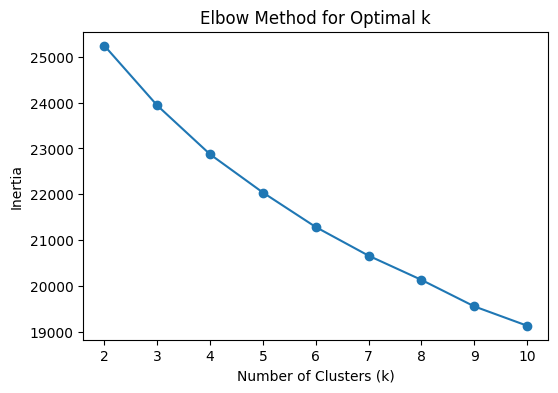

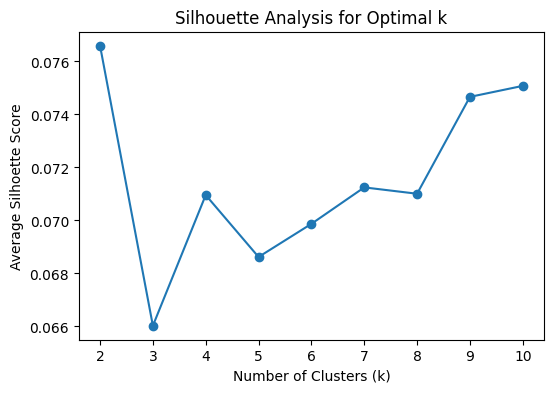

In [ ]:
#Calling the function
elbow_and_silhouette_analysis(df_selected, max_k=11, n_init=10)

The silhouette score was very low no matter what combination of features I used. The eblow graph also did not show any clear 'elbow'. This clearly means that the dataset does not have a natural clustering structure that KMeans could capture, and any value differences in the clusters is mere noise. If I do cluster profiling, I will not be able to make any qualitative insights.

As the next step, I will combine the features and see if it makes the data structure more informative.

I'll revisit clustering after these transformations

# Feature engineering

Since none of the combination of features is improving the clusters, I will perform feature engineering on the 12 variables

In [ ]:
dff = df.copy()

In [ ]:
dff['Profit_Proportion'] = ((dff['Revenue_per_Voyage_USD'] - dff['Operational_Cost_USD']) / dff['Revenue_per_Voyage_USD']) * 100
dff['Cost_per_nm'] = dff['Operational_Cost_USD'] / dff['Distance_Traveled_nm']
dff['Revenue_per_ton'] = dff['Revenue_per_Voyage_USD'] / dff['Cargo_Weight_tons']
dff['Weight_per_kW'] = dff['Cargo_Weight_tons'] / dff['Engine_Power_kW']
dff['Speed_efficiency'] = dff['Speed_Over_Ground_knots'] / dff['Engine_Power_kW']
dff['Turnaround_per_nm'] = dff['Turnaround_Time_hours'] / dff['Distance_Traveled_nm']


I'm selecting the combined features only, since all the relevant information from the raw features is captured within these new ones.

In [ ]:
dff_selected = dff[['Profit_Proportion', 'Cost_per_nm', 'Revenue_per_ton', 'Weight_per_kW', 'Speed_efficiency',
                   'Turnaround_per_nm', 'Efficiency_nm_per_kWh', 'Weekly_Voyage_Count', 'Average_Load_Percentage']]

<Axes: >

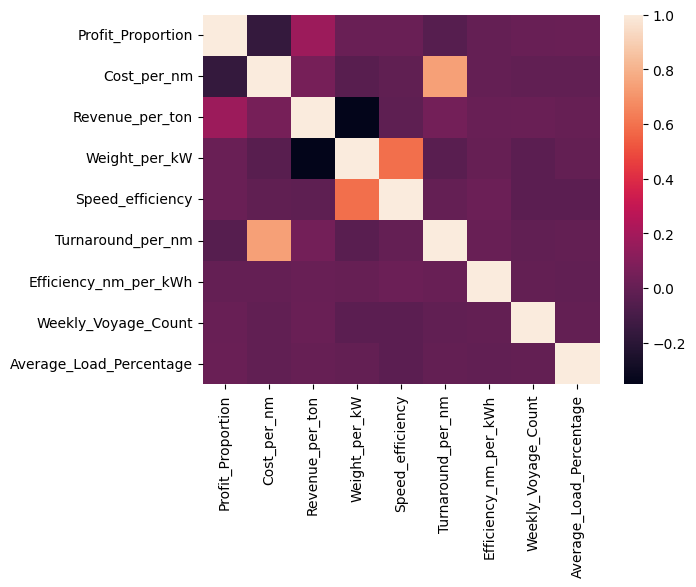

In [ ]:
#Checking correlation of the engineered features
sns.heatmap(dff_selected.select_dtypes(include='number').corr())

As seen from the heatmap, some correlation is seen in the engineered features.

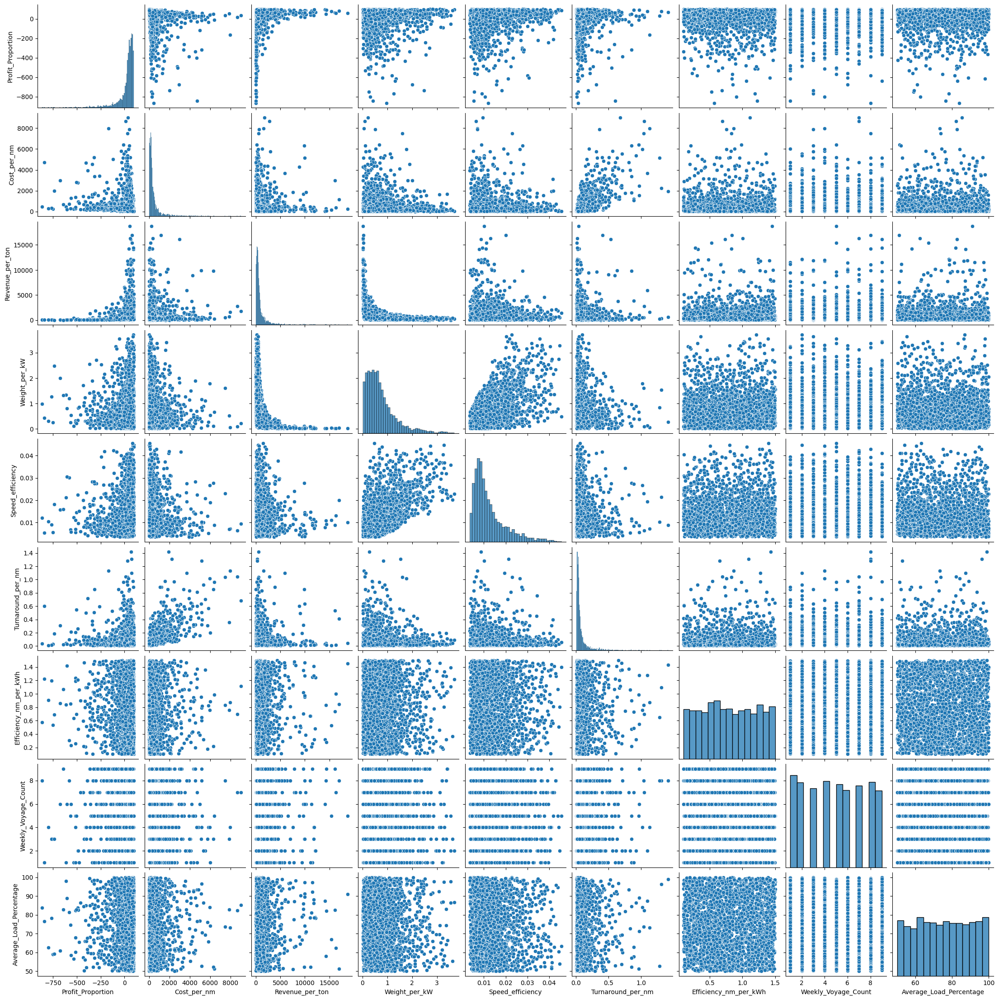

In [ ]:
sns.pairplot(dff_selected)

### Scaling

In [ ]:
dff_engineered = dff_selected.copy()
to_scale = dff_selected.columns
dff_selected[to_scale] = scaler.fit_transform(dff_selected[to_scale])

/tmp/ipython-input-41-1207627757.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff_selected[to_scale] = scaler.fit_transform(dff_selected[to_scale])


In [ ]:
dff_selected.head()

,Profit_Proportion,Cost_per_nm,Revenue_per_ton,Weight_per_kW,Speed_efficiency,Turnaround_per_nm,Efficiency_nm_per_kWh,Weekly_Voyage_Count,Average_Load_Percentage
0,-0.843050,-0.020868,-0.511709,0.354893,-0.841667,-0.436914,1.627007,-1.507346,1.278649
1,0.246712,-0.037692,2.806458,-1.072624,-0.884132,-0.162067,-1.259663,0.417824,1.287343
2,-0.334468,0.242802,0.782180,-1.043414,0.010464,-0.039852,-0.741138,1.572926,1.447458
3,-2.149222,-0.316848,-0.573619,1.931026,1.380398,-0.478310,-0.237289,-1.507346,-0.622127
4,0.366031,-0.357822,1.021312,-0.825526,0.013706,-0.283375,1.320115,1.187892,0.330130


### Elbow method and silhouette analysis of the engineered features

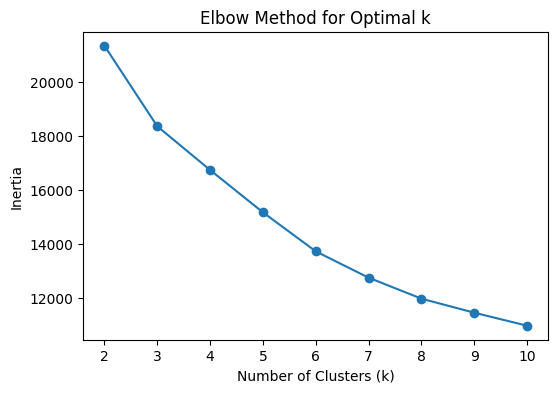

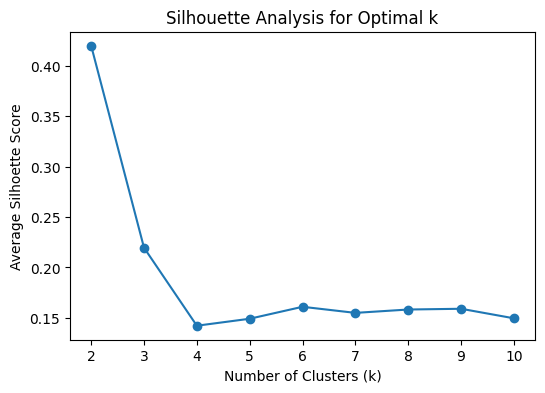

In [ ]:
dff_inertia, dff_sil = elbow_and_silhouette_analysis(dff_selected, max_k=11)

### Applying KMeans for k=2
When I checked with KMeans(n_clusters=3), the profiles were of more bad quality, so I went with 2 clusters

In [ ]:
'''clusters = kmeans.fit_predict(dff_selected)
  labels = kmeans.fit(dff_selected).labels_
  clusters and labels are the exact same thing'''

k= 2

# Validate cluster stability (example: run with 5 different random seeds)
seed=10
stability_scores = []
for i in range(seed):
  kmeans_stable = KMeans(n_clusters=k, random_state=i, n_init=10)
  kmeans_stable.fit(dff_selected)
  stability_scores.append(round(silhouette_score(dff_selected, kmeans_stable.labels_), 3))

print(stability_scores)

#Applying KMeans algorithm with 2 clusters
kmeans = KMeans(n_clusters=k, random_state=i, n_init=10)
kmeans.fit(dff_selected)
dff_selected['cluster'] = kmeans.labels_

dff['cluster'] = dff_selected['cluster']



[np.float64(0.437), np.float64(0.42), np.float64(0.42), np.float64(0.42), np.float64(0.441), np.float64(0.42), np.float64(0.42), np.float64(0.42), np.float64(0.42), np.float64(0.42)]


/tmp/ipython-input-44-1842949451.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dff_selected['cluster'] = kmeans.labels_


For k=2, clusters are stable when check with various seed numbers

### Cluster profiling

In [ ]:
cluster_profiles = []
for cluster_num in range(k):
    cluster_data = dff[dff['cluster'] == cluster_num]
    profile = {
        'cluster': cluster_num,
        'size': len(cluster_data),
    }
    for col in ['Profit_Proportion', 'Cost_per_nm', 'Revenue_per_ton', 'Average_Load_Percentage', 'Speed_Over_Ground_knots',
                'Cargo_Weight_tons', 'Distance_Traveled_nm']:
        profile[col + '_mean'] = cluster_data[col].mean()
        #profile[col + '_median'] = cluster_data[col].median()
    for col in ['Route_Type', 'Maintenance_Status', 'Ship_Type']:
      profile[col + '_counts'] = cluster_data[col].value_counts().to_dict()
    cluster_profiles.append(profile)

cluster_profile_dff = pd.DataFrame(cluster_profiles)

cluster_profile_dff.insert(0, 'Business Labels', ['CLUSTER A - Non-Profitable Voyages', 'CLUSTER B - Profitable Voyages'])

display(cluster_profile_dff)

,Business Labels,cluster,size,Profit_Proportion_mean,Cost_per_nm_mean,Revenue_per_ton_mean,Average_Load_Percentage_mean,Speed_Over_Ground_knots_mean,Cargo_Weight_tons_mean,Distance_Traveled_nm_mean,Route_Type_counts,Maintenance_Status_counts,Ship_Type_counts
0,CLUSTER A - Non-Profitable Voyages,0,168,-9.456004,2903.514061,1398.927616,75.149325,17.341654,924.205370,120.429406,"{'Transoceanic': 52, 'Long-haul': 41, 'Short-haul': 33, 'Coastal': 32, 'Unknown': 10}","{'Good': 60, 'Fair': 49, 'Critical': 45, 'Unknown': 14}","{'Container Ship': 46, 'Bulk Carrier': 44, 'Fish Carrier': 38, 'Tanker': 33, 'Unknown': 7}"
1,CLUSTER B - Profitable Voyages,1,2568,22.137855,327.893950,937.032404,75.223794,17.619952,1039.662752,1096.329918,"{'Long-haul': 645, 'Coastal': 618, 'Short-haul': 593, 'Transoceanic': 586, 'Unknown': 126}","{'Fair': 818, 'Critical': 815, 'Good': 813, 'Unknown': 122}","{'Bulk Carrier': 625, 'Fish Carrier': 615, 'Tanker': 610, 'Container Ship': 589, 'Unknown': 129}"


### Clustering visualizing using PCA

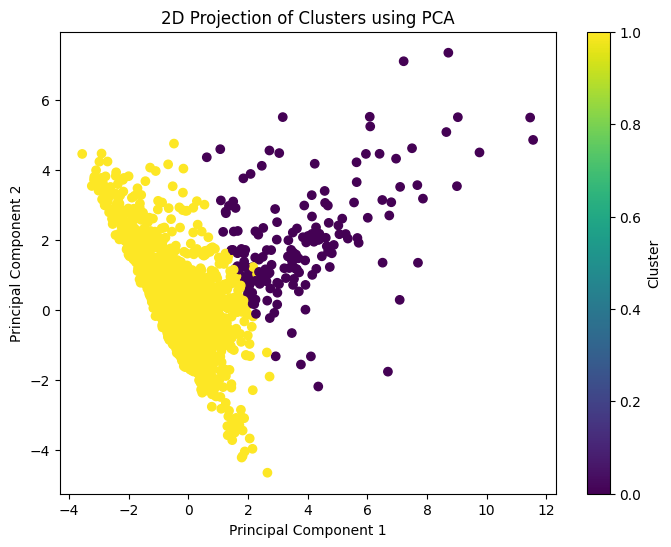

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
dff_pca = pca.fit_transform(dff_selected.drop('cluster', axis=1))

plt.figure(figsize=(8, 6))
plt.scatter(dff_pca[:, 0], dff_pca[:, 1], c=dff_selected['cluster'], cmap='viridis')
plt.title('2D Projection of Clusters using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()


# Insights from the clusters

**Which cluster is most cost-effective?**

* Cluster B is most cost effective.
  * Average cost per nautical mile is low (327 USD), and the Revenue per Ton yields a profit margin of 22%.
  * The noticable difference is that this cluster has been on long voyages, as average distance is 1096nm.
* Cluster A has non-profitable voyages
  * Average cost per nautical mile is very high (2093), and the revenue generated results in an average loss of 9%.
  * These voyages go on short distances (mean: 120nm)

**Which ship or route types appear in underperforming clusters?**

Ship type or Route type doesn't seem to effect voyage performance since all ships and routes are almost equally represented across both clusters.

**How can these insights help optimize future voyages?**

The difference between Cluster A and B appears to be of the distance travelled. The voyages in Cluster B has a longer distance route, an average of 1093nm. Therefore, longer distances voyages appear to be more profitable.

The company should consider prioritizing long distance voyages.

## Business Recommendations
* **Route Optimization and Discontinuation**

Prioritize long-distance routes and review or discontinue short-distance routes which suffer from high operational costs and result in an average loss of 9%, despite higher per-ton revenue.

* **Ideal Ship Configurations for Maximum Profitability**

No difference is seen in the ship type, ship speed etc

* **Maintenance recommendations based on cluster trends**

Fair, Good, and Critical ships are roughly in equal frequency in both clusters, hence no difference is observed because of ship maintenance.




In [ ]:
c